## Data
- primary-screen-replicate-collapsed-logfold-change.csv: 
    - This dataset contains an
unbiased cancer cell line growth inhibition (GI) screen over compounds. The column
headers represent the various drugs that were tested and are given in the format
“{drug_id}::{concentration in micromolar}::{screen_type}”. The row
labels are simply cancer cell line IDs. Each value in the CSV represents the measured
impact of the drug on cancer cell growth measured in log-fold change. Let GT and GC
represent the number of cells present at the end of the experiment under the treatment
and control conditions respectively. Then the log-fold change is given by log2
(GT/GC).
- <b>primary-screen-replicate-collapsed-treatment-info.csv:</b>
    - This csv contains metadata
for the drugs used in the experiment including drug names, their putative mechanisms of
action, and their putative targets. The relevant key is the column broad_id which
matches the drug_ids used in the column headers of the previous file.
- primary-screen-cell-line-info.csv:
    - This csv contains metadata for the cancer cells used
in the experiment.
- targets-of-interest.csv:
    - This csv contains a simple list of MOAs to focus on in your
initial exploration.
- chemical-similarity.csv:
    - This csv contains a similarity matrix for all pairs of drugs in the
primary screen dataset based on a measure of chemical similarity.

## Goals
1. Using GI data which, if any, drugs labeled as having a target of interest appear likely to
derive their anti-cancer effect from some other target? You don’t need to predict the true
target, it is sufficient to identify drugs that look mischaracterized.
2. Using GI data, can you identify other compounds in the dataset that are likely to impact
one of the targets of interest but are currently labeled with another putative target or
none at all?
3. Describe (no need to implement!) how you would modify your approach to the previous
questions if you were asked to use both GI data and compound-compound chemical
similarity values.

Your approach should use quantitative metrics to answer the first three questions. We are most
interested in the approach you take, the reasoning behind it, and the evidence you generate to
support your hypotheses.

## Deliverables
1) Your answers to the questions above with supporting quantitative data
2) Code that can be run to produce your results
3) Any format of your choosing (slides, document, visualizations in notebook, etc) to aid in
your presentation walking us through your approach

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import tempfile
from devkit.dataset import fetch_file, unzip_to_data_subdir, get_subdir_files_as_dict
data = get_subdir_files_as_dict('MELIORA')
data

{'primary-screen-cell-line-info.csv': 'F:\\data\\MELIORA\\primary-screen-cell-line-info.csv',
 'primary-screen-readme.txt': 'F:\\data\\MELIORA\\primary-screen-readme.txt',
 'primary-screen-replicate-collapsed-logfold-change.csv': 'F:\\data\\MELIORA\\primary-screen-replicate-collapsed-logfold-change.csv',
 'primary-screen-replicate-collapsed-treatment-info.csv': 'F:\\data\\MELIORA\\primary-screen-replicate-collapsed-treatment-info.csv',
 'targets-of-interest.csv': 'F:\\data\\MELIORA\\targets-of-interest.csv',
 'chemical-similarity.csv': 'F:\\data\\MELIORA\\chemical-similarity.csv'}

# Narrative
1. download the data and peak at it in excel to get an idea of what we are dealing with

# EDA ideas
 - first instinct is to do 


# Notes about data
-  the data set needs a lot of molecular cleaning, malformed smiles, salts, metals, missing...and since i know it is the broad....stereo chem and name/struct agreement is an issue. 
- Its unclear what the dosage was, but they all look to be about same dosage. 
- the MOA and targets are problematic. There is no clear ontology for the MOA and targets don't seem to all be HGNC symbols or enesemble ids


# Approach
 - <b>Direct Prediction:</b> Idea: use representations of molecules to perfrom a multilabel prediction 
    - The entire premise is that some drugs are mislabeled so if when we look at model disagreements then we would still be left wondering if the model was right and the data mislabeled or vice-versa. We would also need to be relatively confident as to what the mislabeling rate was....  but if our best underfit model agrees than we can be pretty confident the moa is not misclassified
 - <b>Cluster Heterogenity</b>
    - We could use the 3 readily available feature domains to make 3 independent clusterings. If a cluster is largely homogenous in moa/target label except for 1, then that 1 is likely misclassified. Reverse we can look at MOA/Target groupings and look at there silhoute score relative to all others and if one is inconsistent then

In [3]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

In [4]:
gidf = pd.read_csv(data['primary-screen-replicate-collapsed-logfold-change.csv'])
gidf = gidf.rename(columns={'Unnamed: 0':'CellLineID'})
gidf = gidf.set_index("CellLineID")
gidf = gidf.fillna(gidf.mean())
gidf = gidf.T.sort_index()
gidf

CellLineID,ACH-000001,ACH-000007,ACH-000008,ACH-000010_FAILED_STR,ACH-000011,ACH-000012,ACH-000013,ACH-000014,ACH-000015,ACH-000018,...,ACH-001200,ACH-001205,ACH-001210,ACH-001211,ACH-001212,ACH-001239,ACH-001306,ACH-001307,ACH-001318,ACH-001321
BRD-A00055058-001-01-0::2.325889319::MTS004,0.515743,0.196878,0.347821,0.013977,-0.001031,-0.302195,0.716114,0.409388,-0.049488,0.008093,...,0.535443,0.423955,0.379127,0.352770,0.081745,-0.433834,-0.163176,0.272307,-0.039683,-0.442835
BRD-A00077618-236-07-6::2.5::HTS,-0.015577,-0.095730,0.379480,0.118890,0.145346,0.103348,0.353010,0.128302,0.166727,0.831733,...,0.323892,0.338311,0.637148,0.574641,1.245597,0.059884,0.159443,-0.544829,-0.012480,-0.269815
BRD-A00100033-001-08-9::2.5::HTS,-0.449332,0.257943,-0.596132,-0.231615,-0.499274,0.063870,0.038872,-0.516359,0.224048,-0.491812,...,-0.170384,-0.484385,0.660825,0.432232,-0.074884,-0.157487,-0.156117,-0.954725,-0.065810,-0.139671
BRD-A00147595-001-01-5::2.5::HTS,0.489379,0.772349,0.548056,0.621937,0.267470,0.088670,0.389884,0.195350,0.707707,0.157091,...,0.660664,-0.292430,1.329102,-0.036033,0.126575,0.030140,0.480380,0.695190,0.249521,0.169287
BRD-A00218260-001-03-4::2.5::HTS,0.206675,-0.438502,0.422269,-0.202707,0.157804,0.484581,-0.112096,0.242858,0.357244,0.371927,...,0.223016,0.025905,0.584948,0.334230,-0.347024,0.386968,0.166258,0.662730,-0.251258,0.408545
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
BRD-U08520523-000-01-0::2.5::HTS,0.125641,-0.394254,-0.820576,-0.259058,-0.352543,-0.259058,-0.535281,-0.455778,-0.591036,-0.390583,...,0.602531,-0.457745,-0.342003,-1.012835,-1.875761,-0.286149,0.097229,0.506065,-0.296072,0.132927
BRD-U25960968-000-01-9::2.5::HTS,-0.067407,-0.275891,-0.323379,-0.680280,-0.534487,0.540634,-1.181018,-0.434304,-0.303529,-0.003341,...,0.162418,-0.123514,-0.444830,-0.159060,0.100302,0.239181,-0.203705,0.207075,0.390924,-0.332921
BRD-U45393375-000-01-6::2.5::HTS,0.448387,-0.191386,0.035115,0.187858,-0.011005,-0.185457,0.502051,0.213894,0.193819,-0.006284,...,0.706640,0.243794,0.208710,-0.273245,0.369307,0.288338,-0.084635,0.218176,0.657853,0.386129
BRD-U48018661-000-01-9::2.5::HTS,-0.194616,0.499452,-0.057839,0.040626,0.119944,0.148812,-0.003642,-0.005868,-1.072294,-0.083252,...,-0.007628,0.267829,-0.287458,0.387318,1.142169,-0.163063,0.509676,-0.130757,0.334246,-0.452692


In [5]:
tdf = pd.read_csv(data["primary-screen-replicate-collapsed-treatment-info.csv"]).sort_values('column_name')
for a,b in zip(gidf.index,tdf.column_name):
    assert a == b
tdf

,column_name,broad_id,name,dose,screen_id,moa,target,disease.area,indication,smiles,phase
0,BRD-A00055058-001-01-0::2.325889319::MTS004,BRD-A00055058-001-01-0,RS-0481,2.325889,MTS004,immunostimulant,NaN,NaN,NaN,CC(NC(=O)C1CSCN1C(=O)c1ccccc1)c1ccccc1,Phase 2
539,BRD-A00077618-236-07-6::2.5::HTS,BRD-A00077618-236-07-6,8-bromo-cGMP,2.500000,HTS,PKA activator,PRKG1,NaN,NaN,Nc1nc(O)c2nc(Br)n([C@@H]3O[C@@H]4COP(O)(=O)O[C...,Preclinical
540,BRD-A00100033-001-08-9::2.5::HTS,BRD-A00100033-001-08-9,nifurtimox,2.500000,HTS,DNA inhibitor,NaN,infectious disease,"Chagas disease, African trypanosomiasis",CC1CS(=O)(=O)CCN1N=Cc1ccc(o1)[N+]([O-])=O,Launched
541,BRD-A00147595-001-01-5::2.5::HTS,BRD-A00147595-001-01-5,balaglitazone,2.500000,HTS,"insulin sensitizer, PPAR receptor partial agonist",PPARG,NaN,NaN,Cn1c(COc2ccc(CC3SC(=O)NC3=O)cc2)nc2ccccc2c1=O,Phase 3
542,BRD-A00218260-001-03-4::2.5::HTS,BRD-A00218260-001-03-4,flutrimazole,2.500000,HTS,sterol demethylase inhibitor,NaN,infectious disease,mycosis,Fc1ccc(cc1)C(c1ccccc1)(c1ccccc1F)n1ccnc1,Launched
...,...,...,...,...,...,...,...,...,...,...,...
4681,BRD-U08520523-000-01-0::2.5::HTS,BRD-U08520523-000-01-0,colesevalam,2.500000,HTS,NaN,NaN,NaN,NaN,NaN,Preclinical
4682,BRD-U25960968-000-01-9::2.5::HTS,BRD-U25960968-000-01-9,tyloxapol,2.500000,HTS,NFkB pathway inhibitor,"LPL, NFKB2",NaN,NaN,"C=O.C1CO1.CC(C)(C)CC(C)(C)c1ccc(O)cc1, , , C=O...",Launched
4683,BRD-U45393375-000-01-6::2.5::HTS,BRD-U45393375-000-01-6,sevelamer,2.500000,HTS,phosphate antagonist,NaN,nephrology,chronic kidney disease (CKD),", NCC=C.ClCC1CO1",Launched
4684,BRD-U48018661-000-01-9::2.5::HTS,BRD-U48018661-000-01-9,tyloxapol,2.500000,HTS,NFkB pathway inhibitor,"LPL, NFKB2",NaN,NaN,"C=O.C1CO1.CC(C)(C)CC(C)(C)c1ccc(O)cc1, , , C=O...",Launched


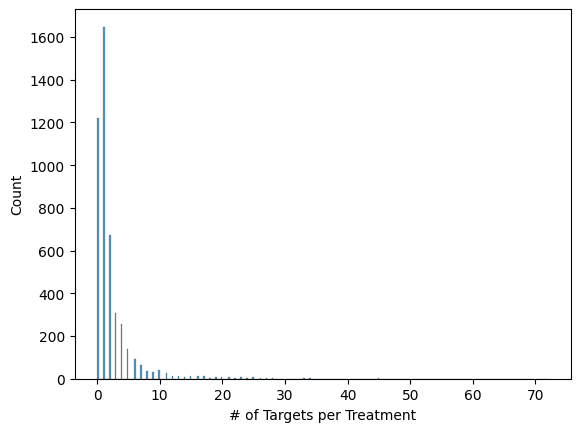

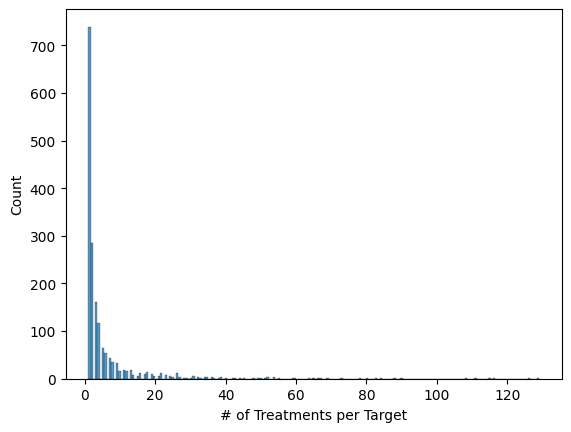

In [6]:
all_targets = set()
for tgs in tdf.target:
    targets = set([t.strip() for t in str(tgs).split(",")])
    for t in targets:
        if t != 'nan':
            all_targets.add(t)
            
sorted_targets = sorted(all_targets)
index_to_target = {i:t for i,t in enumerate(sorted_targets)}
target_to_index = {t:i for i,t in enumerate(sorted_targets)}
target_vectors = []
for tgs in tdf.target:
    targets = set([t.strip() for t in str(tgs).split(",")])
    tx = np.zeros(len(sorted_targets))
    for t in targets:
        if t != 'nan':
            tx[target_to_index[t]] = 1
    target_vectors.append(tx)
T = np.vstack(target_vectors)
sns.histplot(T.sum(axis=1))
plt.xlabel('# of Targets per Treatment')
plt.show()
sns.histplot(T.sum(axis=0))
plt.xlabel('# of Treatments per Target')
plt.show()

In [7]:
cdf = pd.read_csv(data['primary-screen-cell-line-info.csv'])
depmap_to_primary_tissue = dict(zip(cdf.depmap_id,cdf.primary_tissue))
cdf.primary_tissue.value_counts()

primary_tissue
lung                         101
skin                          43
central_nervous_system        42
ovary                         38
pancreas                      37
colorectal                    35
upper_aerodigestive           27
breast                        26
esophagus                     24
urinary_tract                 24
bone                          23
uterus                        23
gastric                       21
liver                         21
kidney                        19
rhabdoid                      12
peripheral_nervous_system     12
thyroid                       11
mesothelioma                   9
bile_duct                      7
soft_tissue                    5
prostate                       4
rhabdomyosarcoma               3
fibroblast                     1
Name: count, dtype: int64

In [8]:
broad_to_moa = dict(zip(tdf.column_name,tdf.moa))

from collections import defaultdict
target_to_bids = defaultdict(list)
bid_to_targets = defaultdict(list)
for bid,targets in zip(tdf.column_name,tdf.target):
    for t in str(targets).split(","):
        ts = t.strip()
        target_to_bids[ts].append(bid)
        bid_to_targets[bid].append(ts)

moa_to_bids = defaultdict(list)
for bid,moas in zip(tdf.column_name,tdf.moa):
    for m in str(moas).split(","):
        moa_to_bids[m.strip()].append(bid)

In [9]:
print('Target')
targets_of_interest = [
    'ABL1',
    'BRAF',
    'CDK1',
    'EGFR',
    'HDAC',
    'HMGCR',
    'JAK2',
    'MAP2K1',
    'NR3C1'
]
for k,v in sorted(target_to_bids.items(),key=lambda x:len(x[1]),reverse=True):
    if k in targets_of_interest:
        print(k,len(v))

Target
NR3C1 66
EGFR 54
JAK2 22
CDK1 21
MAP2K1 18
ABL1 17
BRAF 14
HMGCR 12


In [10]:
print('MOA')
for k,v in sorted(moa_to_bids.items(),key=lambda x:len(x[1]),reverse=True):
    print(k,len(v))

MOA
nan 361
cyclooxygenase inhibitor 110
adrenergic receptor antagonist 98
serotonin receptor antagonist 96
adrenergic receptor agonist 88
dopamine receptor antagonist 85
acetylcholine receptor antagonist 78
histamine receptor antagonist 70
phosphodiesterase inhibitor 66
glutamate receptor antagonist 66
bacterial cell wall synthesis inhibitor 61
serotonin receptor agonist 57
glucocorticoid receptor agonist 54
EGFR inhibitor 49
PI3K inhibitor 47
calcium channel blocker 46
sodium channel blocker 42
VEGFR inhibitor 42
acetylcholine receptor agonist 41
dopamine receptor agonist 39
topoisomerase inhibitor 39
bacterial DNA gyrase inhibitor 37
benzodiazepine receptor agonist 33
protein synthesis inhibitor 33
mTOR inhibitor 33
HDAC inhibitor 33
tubulin polymerization inhibitor 32
CDK inhibitor 30
estrogen receptor agonist 28
opioid receptor agonist 26
ATPase inhibitor 26
PPAR receptor agonist 26
cytochrome P450 inhibitor 26
NFkB pathway inhibitor 26
PDGFR tyrosine kinase receptor inhibitor 26


In [11]:
def labels_to_colors(x):
    ux = np.unique(x)
    # List of RGB triplets
    rgb_values = sns.color_palette("tab20b", len(ux))
    # Map label to RGB
    color_map = dict(zip(set(ux), rgb_values))
    colors = [color_map[e] for e in x]
    return colors

col_colors = labels_to_colors(gidf.columns.to_list())
row_colors = labels_to_colors(gidf.index.to_list())

<Figure size 3000x3000 with 0 Axes>

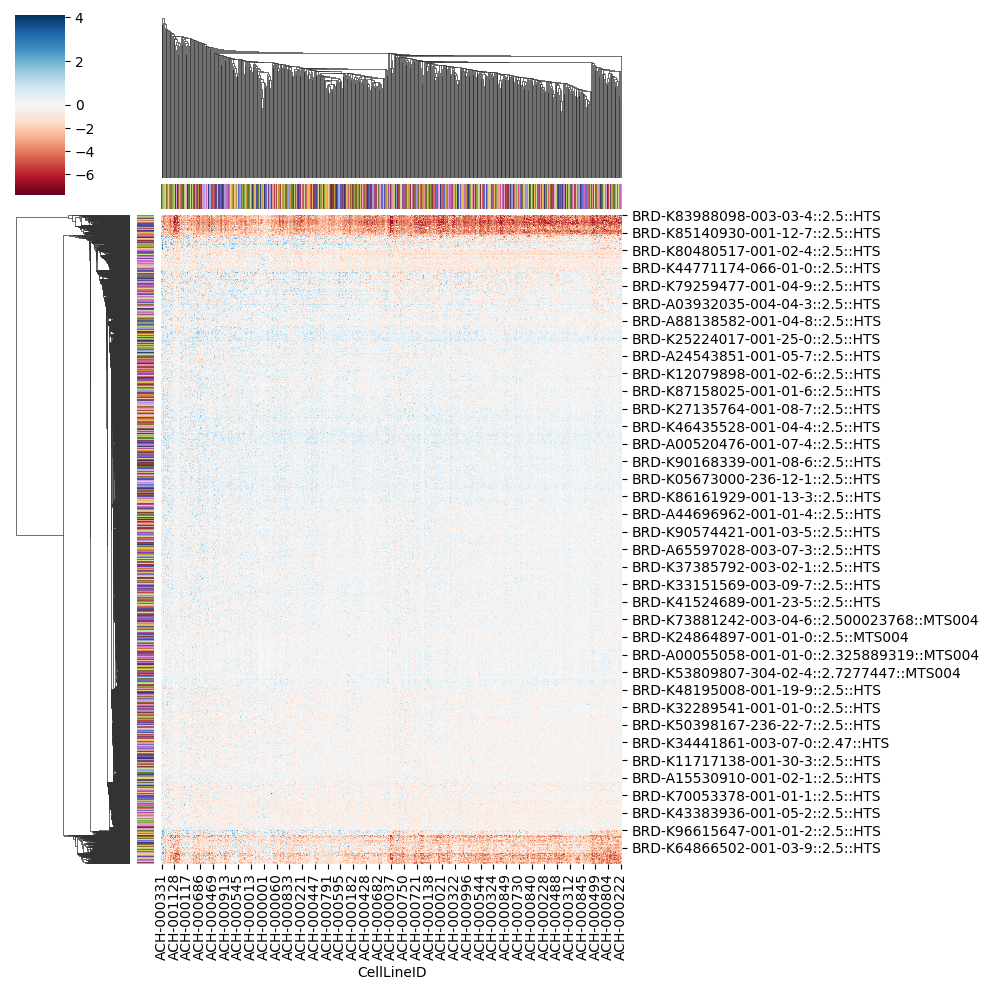

In [12]:
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.colors as mcolors
plt.figure(figsize=(30,30))
vcenter = 0
X = gidf.to_numpy()
vmin, vmax = X.min(), X.max()
normalize = mcolors.TwoSlopeNorm(vcenter=vcenter, vmin=vmin, vmax=vmax)
colormap = cm.RdBu

sns.clustermap(gidf, cmap=colormap,metric="euclidean",norm=normalize,row_colors=row_colors,col_colors=col_colors)# metric="cosine"

In [13]:
from devkit.utils import tqdm_imap
import numpy as np
import pandas as pd
import umap
from rdkit import Chem
from rdkit.Chem import AllChem, DataStructs
import matplotlib.pyplot as plt

def smi_to_fingerprint(smiles,radius=2, nBits=2048):
    mol = Chem.MolFromSmiles(smiles)
    if mol:
        fp = AllChem.GetMorganFingerprintAsBitVect(mol, radius, nBits=nBits)
        arr = np.zeros((1,), dtype=np.uint8)
        DataStructs.ConvertToNumpyArray(fp, arr)
        return arr
    else:
        return None
#fingerprints = tqdm_imap(tdf.smiles.to_list(),smi_to_fingerprint,n_procs=1)

In [14]:
from sklearn.decomposition import KernelPCA, PCA
from sklearn.cluster import OPTICS, cluster_optics_dbscan, KMeans
import numpy as np
from sklearn.metrics import davies_bouldin_score
from sklearn.metrics import calinski_harabasz_score
from sklearn.metrics import silhouette_score, silhouette_samples
from collections import Counter
from sklearn.cluster import KMeans
from sklearn.metrics.pairwise import euclidean_distances
from sklearn.decomposition import PCA
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier, NeighborhoodComponentsAnalysis
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler, Normalizer
from tqdm.auto import tqdm

f:\miniconda\envs\n8dev\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


UMAP(min_dist=0.25, n_components=5, random_state=12, verbose=True)
Sun Jan 28 20:58:31 2024 Construct fuzzy simplicial set
Sun Jan 28 20:58:31 2024 Finding Nearest Neighbors
Sun Jan 28 20:58:31 2024 Building RP forest with 8 trees
Sun Jan 28 20:58:35 2024 NN descent for 12 iterations
	 1  /  12
	 2  /  12
	 3  /  12
	 4  /  12
	 5  /  12
	 6  /  12
	Stopping threshold met -- exiting after 6 iterations
Sun Jan 28 20:58:48 2024 Finished Nearest Neighbor Search
Sun Jan 28 20:58:51 2024 Construct embedding


Epochs completed:   0%|            0/500 [00:00]

	completed  0  /  500 epochs
	completed  50  /  500 epochs
	completed  100  /  500 epochs
	completed  150  /  500 epochs
	completed  200  /  500 epochs
	completed  250  /  500 epochs
	completed  300  /  500 epochs
	completed  350  /  500 epochs
	completed  400  /  500 epochs
	completed  450  /  500 epochs
Sun Jan 28 20:59:03 2024 Finished embedding


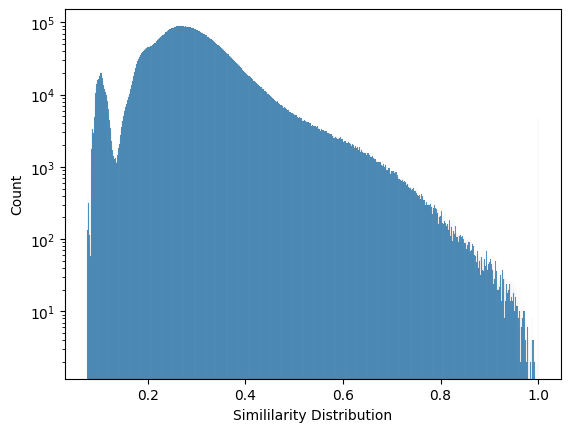

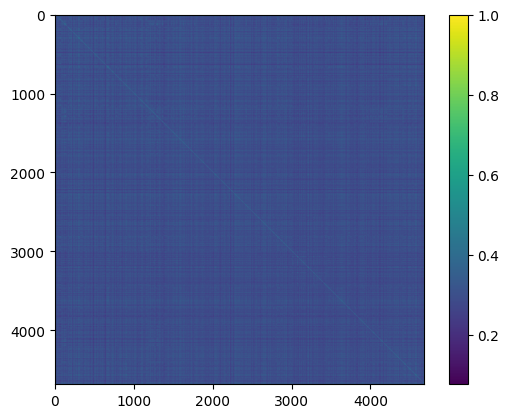

Similarity Matrix Shape (4686, 4686)


In [15]:
# Dimension Reduction
sub_dim = 50
random_state = 1256

# Sub Dim Options
pca = PCA(n_components=sub_dim,whiten=True, random_state=random_state)
#lda = LinearDiscriminantAnalysis(n_components=sub_dim)
#nca = NeighborhoodComponentsAnalysis(n_components=sub_dim, random_state=random_state)

dr = pca
ss = StandardScaler()
#X = ss.fit_transform(gidf.to_numpy())
X = gidf.to_numpy()
drX = dr.fit_transform(X)


reducer = umap.UMAP(
    n_components=5,
    verbose=True,
    n_neighbors=15,
    min_dist=0.25,
    spread=1.0,
    metric="euclidean",
    random_state=12,
    )
nnX = reducer.fit_transform(drX)
XX = euclidean_distances(nnX)
XX = 1 / (1+XX)

# Distribution
sns.histplot(XX.flatten())
plt.yscale('log')
plt.xlabel('Simililarity Distribution')
plt.show()

# Matrix
plt.imshow(XX)
plt.colorbar()
plt.show()

# Clusters
#sns.clustermap(XX)
#plt.show()

print("Similarity Matrix Shape",XX.shape)

In [31]:
k = 10+1 # +1 is because we are including itself
p = 10

max_prob = []
max_prob_target = []
mean_sims = []

for i in tqdm(range(len(XX))):
    arr = XX[i,:]
    top_k_indices = np.argsort(arr)[-k:-1]
    sims = arr[top_k_indices]
    neighor_ts = T[top_k_indices]
    
    wts = (neighor_ts * np.atleast_2d(sims).T).sum(0) / sims.sum()
    #wts = neighor_ts.sum(0) / (k)

    top_p_indices = np.argsort(wts)[-p:]
    target_weights = wts[top_p_indices]
    top_p_targets = [index_to_target[i] for i in top_p_indices]
    mean_sims.append(sims.mean())
    max_prob.append(target_weights[-1])
    max_prob_target.apped(top_p_targets[-1])


    if "NR3C1" in str(tdf.target.to_numpy()[i]) or max(target_weights) > 0.9:
        print('-----------')
        print(i,top_k_indices,sims,neighor_ts.shape)
        print('Self:',tdf.target.to_numpy()[i])
        for nni, nn_targets in enumerate(tdf.target.to_numpy()[top_k_indices]):
            print(nni,nn_targets)
        print('Targets and Weights')
        print(wts.max(),wts.shape)
        print('Target Probs:  ',top_p_targets)
        print('Target Weights:',target_weights)
        
plt.scatter(mean_sims,)


  0%|          | 0/4686 [00:00<?, ?it/s]

-----------
19 [ 293 4085  131] [0.79880893 0.8177456  0.8649325 ] (3, 1796)
Self: NR3C1
0 NHP2L1, RPL10L, RPL11, RPL13A, RPL15, RPL19, RPL23, RPL23A, RPL26L1, RPL3, RPL37, RPL8, RSL24D1
1 HRH1
2 MDM2, TP53
Targets and Weights
0.34855409881773936 (1796,)
Target Probs:   ['HRH1', 'TP53', 'MDM2']
Target Weights: [0.32953854 0.3485541  0.3485541 ]
-----------
23 [485 643 139] [0.9125562  0.93803114 0.97849315] (3, 1796)
Self: NR3C1
0 NR3C1, PLA2G1B
1 NR3C1
2 NR3C1
Targets and Weights
0.9999999578628865 (1796,)
Target Probs:   ['ZACN', 'PLA2G1B', 'NR3C1']
Target Weights: [0.         0.32256281 0.99999996]
-----------
32 [2357 3094 2461] [0.83252716 0.8422084  0.8744399 ] (3, 1796)
Self: nan
0 HSP90AA1
1 HSP90AA1
2 HSP90AA1, HSP90AB1
Targets and Weights
0.9999999766180694 (1796,)
Target Probs:   ['ZACN', 'HSP90AB1', 'HSP90AA1']
Target Weights: [0.         0.34302852 0.99999998]
-----------
111 [ 849 2137 4634] [0.9581764 0.9680673 0.9701834] (3, 1796)
Self: ANXA1, NOS2, NR0B1, NR3C1, NR3C2


In [17]:
# Clustering
reducer = umap.UMAP(
    n_components=4,
    verbose=True,
    n_neighbors=15,
    min_dist=0.25,
    spread=1.0,
    metric="euclidean",
    random_state=12,
    )
Ec = reducer.fit_transform(drX)
#clust = OPTICS(min_samples=3, xi=0.01, min_cluster_size=0.0011)
#clust.fit(Ec)
#space = np.arange(len(Ec))
#reachability = clust.reachability_[clust.ordering_]
#labels = clust.labels_[clust.ordering_]
clust = KMeans(n_clusters=27,random_state=12,)
clust.fit(Ec)
labels = clust.labels_
print('Labels:',labels)


# Compute UMAP
reducer = umap.UMAP(
    verbose=True,
    n_neighbors=15,
    min_dist=0.25,
    spread=1.0,
    metric="euclidean",
    random_state=12,
    )
embedding = reducer.fit_transform(drX)
um1,um2 = embedding[:, 0], embedding[:, 1]

# Plot w/ Cluster
plt.figure(figsize=(10,10))
sns.despine()

# get sample wise silhoute score
ss_scores = silhouette_samples(drX,labels)

umk_df = pd.DataFrame(
    {
        "treatment_id":gidf.index.to_list(),
        "umap_1":um1,
        "umap_2":um2,
        "cluster_labels":labels,
        "sample_silhouette_score":ss_scores
    }
)
umk_df

f:\miniconda\envs\n8dev\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


UMAP(min_dist=0.25, n_components=4, random_state=12, verbose=True)
Sun Jan 28 20:59:29 2024 Construct fuzzy simplicial set
Sun Jan 28 20:59:29 2024 Finding Nearest Neighbors
Sun Jan 28 20:59:29 2024 Building RP forest with 8 trees
Sun Jan 28 20:59:30 2024 NN descent for 12 iterations
	 1  /  12
	 2  /  12
	 3  /  12
	 4  /  12
	 5  /  12
	 6  /  12
	Stopping threshold met -- exiting after 6 iterations
Sun Jan 28 20:59:30 2024 Finished Nearest Neighbor Search
Sun Jan 28 20:59:30 2024 Construct embedding


Epochs completed:   0%|            0/500 [00:00]

	completed  0  /  500 epochs
	completed  50  /  500 epochs
	completed  100  /  500 epochs
	completed  150  /  500 epochs
	completed  200  /  500 epochs
	completed  250  /  500 epochs
	completed  300  /  500 epochs
	completed  350  /  500 epochs
	completed  400  /  500 epochs
	completed  450  /  500 epochs
Sun Jan 28 20:59:40 2024 Finished embedding


f:\miniconda\envs\n8dev\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


Labels: [ 6  1  7 ... 12 22 12]
UMAP(min_dist=0.25, random_state=12, verbose=True)
Sun Jan 28 20:59:40 2024 Construct fuzzy simplicial set
Sun Jan 28 20:59:40 2024 Finding Nearest Neighbors
Sun Jan 28 20:59:40 2024 Building RP forest with 8 trees
Sun Jan 28 20:59:40 2024 NN descent for 12 iterations
	 1  /  12
	 2  /  12
	 3  /  12
	 4  /  12


f:\miniconda\envs\n8dev\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


	 5  /  12
	 6  /  12
	Stopping threshold met -- exiting after 6 iterations
Sun Jan 28 20:59:40 2024 Finished Nearest Neighbor Search
Sun Jan 28 20:59:40 2024 Construct embedding


Epochs completed:   0%|            0/500 [00:00]

	completed  0  /  500 epochs
	completed  50  /  500 epochs
	completed  100  /  500 epochs
	completed  150  /  500 epochs
	completed  200  /  500 epochs
	completed  250  /  500 epochs
	completed  300  /  500 epochs
	completed  350  /  500 epochs
	completed  400  /  500 epochs
	completed  450  /  500 epochs
Sun Jan 28 20:59:50 2024 Finished embedding


,treatment_id,umap_1,umap_2,cluster_labels,sample_silhouette_score
0,BRD-A00055058-001-01-0::2.325889319::MTS004,2.926201,-3.782103,6,0.182496
1,BRD-A00077618-236-07-6::2.5::HTS,-2.556064,-4.000098,1,0.070910
2,BRD-A00100033-001-08-9::2.5::HTS,-1.223405,1.604778,7,0.083517
3,BRD-A00147595-001-01-5::2.5::HTS,-2.730330,-4.128964,1,0.085173
4,BRD-A00218260-001-03-4::2.5::HTS,-2.475107,-2.423636,18,-0.135108
...,...,...,...,...,...
4681,BRD-U08520523-000-01-0::2.5::HTS,-3.515290,-1.646635,12,-0.046997
4682,BRD-U25960968-000-01-9::2.5::HTS,0.980083,-2.916745,2,-0.210052
4683,BRD-U45393375-000-01-6::2.5::HTS,-1.962394,-1.306155,12,-0.126996
4684,BRD-U48018661-000-01-9::2.5::HTS,-2.445299,0.263680,22,-0.063058


<Figure size 1000x1000 with 0 Axes>

In [18]:
from collections import defaultdict
from sklearn.feature_selection import f_classif
from sklearn.ensemble import RandomForestClassifier

cluster_meta_data = defaultdict(list)
k = max(labels)
print(k,labels)

for klass, color in zip(range(0, k), sns.color_palette("tab20b", k)):
    
    # Cluster Info
    cluster_bit_vec = np.array(clust.labels_ == klass)
    cluster_size = np.sum(cluster_bit_vec)
    print(f"\nCluster #{klass} Size = {cluster_size}")
    
    # Cluster Quality
    cluster_silhouette_avg = np.mean(ss_scores[clust.labels_ == klass])
    print(f'Cluster Silhouette Avg Score: {cluster_silhouette_avg}')

    # Cluster Target/MOA Homogeneity
    cluster_targets = []
    bids = gidf.index.to_numpy()[cluster_bit_vec]
    for tgs in [bid_to_targets[bid] for bid in bids]:
        cluster_targets.extend(tgs)
    target_cc = Counter(cluster_targets)

    max_target_percentage = 0
    max_target = None
    target_desc = []
    for target,count in target_cc.most_common(3):
        target_percentage = (count/cluster_size) * 100
        if target_percentage > max_target_percentage and target != 'nan':
            max_target_percentage = target_percentage
            max_target = target
        s = f"{target}: {target_percentage:0.02f}%"
        print(s)
        target_desc.append(s)


    # Cluster Cell Line Features
    """ #A bit to slow for my laptop
    clf = RandomForestClassifier(n_estimators=100, random_state=42)
    clf.fit(X, cluster_bit_vec)
    feature_importances = clf.feature_importances_
    for col,vi in zip(gidf.columns,feature_importances):
        try:
            tissue = depmap_to_primary_tissue[col]
        except KeyError:
            tissue = None
        print(col,vi,tissue)
    """
    f_statistic, p_values = f_classif(X, cluster_bit_vec)
    sorted_indices = np.argsort(f_statistic)[::-1][0:5]

    col_to_index = {col:i for i,col in enumerate(gidf.columns)}
    cell_desc = []
    for col,fstat,pval in zip(gidf.columns.to_numpy()[sorted_indices],f_statistic[sorted_indices], p_values[sorted_indices]):
        x_cluster = X[cluster_bit_vec,col_to_index[col]]
        x_rest = X[~cluster_bit_vec,col_to_index[col]]
        clust_mean = np.mean(x_cluster)
        rest_mean = np.mean(x_rest)
        delta = clust_mean - rest_mean
        # positive delta implies cell growth, negative implies cell death
        if delta >= 0:
            rel = 'Promoted Cell Growth'
        else:
            rel = 'Inhibited Cell Growth'
        
        try:
            tissue = depmap_to_primary_tissue[col]
        except KeyError:
            tissue = None
        s = f"Cluster Drugs {rel} in {tissue}:{col} Fstat: {fstat} PVal: {pval} Delta: {delta}"
        print(s)
        cell_desc.append(s)



    cluster_meta_data['id'].append(klass)
    cluster_meta_data['size'].append(np.sum(cluster_size))
    cluster_meta_data['s_score'].append(cluster_silhouette_avg)
    cluster_meta_data['top_target'].append(max_target)
    cluster_meta_data['top_target_percentage'].append(max_target_percentage)
    cluster_meta_data['target_desc'].append(target_desc)
    cluster_meta_data['cell_desc'].append(cell_desc)

    
    # Cluster Top Differentiated Cell Lines

clusterdf = pd.DataFrame(cluster_meta_data)
clusterdf.sort_values("s_score",ascending=False)


26 [ 6  1  7 ... 12 22 12]

Cluster #0 Size = 210
Cluster Silhouette Avg Score: -0.027112871404660004
nan: 26.67%
PTGS2: 5.24%
PTGS1: 4.29%
Cluster Drugs Inhibited Cell Growth in bone:ACH-000748 Fstat: 124.67588256237448 PVal: 1.3719217940075195e-28 Delta: -0.4762541948717041
Cluster Drugs Inhibited Cell Growth in lung:ACH-000390 Fstat: 111.52437377047286 PVal: 8.833404337932576e-26 Delta: -0.5033346736245471
Cluster Drugs Inhibited Cell Growth in kidney:ACH-000433 Fstat: 110.03726722728912 PVal: 1.8381694724236394e-25 Delta: -0.544089061432659
Cluster Drugs Inhibited Cell Growth in bile_duct:ACH-000182 Fstat: 101.56931747350195 PVal: 1.2001920284328748e-23 Delta: -0.5201469168255323
Cluster Drugs Inhibited Cell Growth in ovary:ACH-000966 Fstat: 91.45934095587768 PVal: 1.787068364254001e-21 Delta: -0.5470816995941443

Cluster #1 Size = 282
Cluster Silhouette Avg Score: 0.06512480227465327
nan: 28.37%
HTR2A: 4.96%
DRD2: 4.61%
Cluster Drugs Promoted Cell Growth in breast:ACH-000277 Fstat

,id,size,s_score,top_target,top_target_percentage,target_desc,cell_desc
3,3,72,0.243201,NR3C1,70.833333,"[NR3C1: 70.83%, nan: 18.06%, SERPINA6: 16.67%]",[Cluster Drugs Promoted Cell Growth in pancrea...
23,23,17,0.194300,MAP2K1,70.588235,"[MAP2K1: 70.59%, MAP2K2: 35.29%, nan: 17.65%]",[Cluster Drugs Inhibited Cell Growth in skin:A...
21,21,33,0.154507,EGFR,84.848485,"[EGFR: 84.85%, ERBB2: 57.58%, ERBB4: 21.21%]",[Cluster Drugs Inhibited Cell Growth in lung:A...
6,6,297,0.151224,VDR,4.713805,"[nan: 32.32%, VDR: 4.71%, PTGS1: 3.37%]",[Cluster Drugs Promoted Cell Growth in esophag...
1,1,282,0.065125,HTR2A,4.964539,"[nan: 28.37%, HTR2A: 4.96%, DRD2: 4.61%]",[Cluster Drugs Promoted Cell Growth in breast:...
7,7,241,0.062539,GRIN1,3.734440,"[nan: 22.82%, GRIN1: 3.73%, GRIN2A: 3.32%]",[Cluster Drugs Promoted Cell Growth in lung:AC...
5,5,229,0.055632,PTGS2,5.676856,"[nan: 34.06%, PTGS2: 5.68%, CHRM1: 5.24%]",[Cluster Drugs Promoted Cell Growth in gastric...
9,9,233,0.035912,DRD2,3.862661,"[nan: 21.46%, DRD2: 3.86%, HRH1: 3.86%]",[Cluster Drugs Promoted Cell Growth in thyroid...
8,8,214,0.018282,HTR3A,3.271028,"[nan: 31.78%, HTR3A: 3.27%, ADRA2A: 2.80%]",[Cluster Drugs Promoted Cell Growth in lung:AC...
4,4,275,-0.000903,DRD2,6.181818,"[nan: 32.00%, DRD2: 6.18%, ADRA1A: 5.82%]",[Cluster Drugs Promoted Cell Growth in breast:...


In [19]:
umk_df.columns,umk_df.shape,tdf.columns,tdf.shape, clusterdf.columns

(Index(['treatment_id', 'umap_1', 'umap_2', 'cluster_labels',
        'sample_silhouette_score'],
       dtype='object'),
 (4686, 5),
 Index(['column_name', 'broad_id', 'name', 'dose', 'screen_id', 'moa', 'target',
        'disease.area', 'indication', 'smiles', 'phase'],
       dtype='object'),
 (4686, 11),
 Index(['id', 'size', 's_score', 'top_target', 'top_target_percentage',
        'target_desc', 'cell_desc'],
       dtype='object'))

In [20]:
drug_df = pd.merge(tdf,umk_df,how='left',left_on="column_name",right_on="treatment_id")
big_df = pd.merge(drug_df,clusterdf,how='left',left_on="cluster_labels",right_on="id")
big_df

,column_name,broad_id,name,dose,screen_id,moa,target,disease.area,indication,smiles,...,umap_2,cluster_labels,sample_silhouette_score,id,size,s_score,top_target,top_target_percentage,target_desc,cell_desc
0,BRD-A00055058-001-01-0::2.325889319::MTS004,BRD-A00055058-001-01-0,RS-0481,2.325889,MTS004,immunostimulant,NaN,NaN,NaN,CC(NC(=O)C1CSCN1C(=O)c1ccccc1)c1ccccc1,...,-3.782103,6,0.182496,6.0,297.0,0.151224,VDR,4.713805,"[nan: 32.32%, VDR: 4.71%, PTGS1: 3.37%]",[Cluster Drugs Promoted Cell Growth in esophag...
1,BRD-A00077618-236-07-6::2.5::HTS,BRD-A00077618-236-07-6,8-bromo-cGMP,2.500000,HTS,PKA activator,PRKG1,NaN,NaN,Nc1nc(O)c2nc(Br)n([C@@H]3O[C@@H]4COP(O)(=O)O[C...,...,-4.000098,1,0.070910,1.0,282.0,0.065125,HTR2A,4.964539,"[nan: 28.37%, HTR2A: 4.96%, DRD2: 4.61%]",[Cluster Drugs Promoted Cell Growth in breast:...
2,BRD-A00100033-001-08-9::2.5::HTS,BRD-A00100033-001-08-9,nifurtimox,2.500000,HTS,DNA inhibitor,NaN,infectious disease,"Chagas disease, African trypanosomiasis",CC1CS(=O)(=O)CCN1N=Cc1ccc(o1)[N+]([O-])=O,...,1.604778,7,0.083517,7.0,241.0,0.062539,GRIN1,3.734440,"[nan: 22.82%, GRIN1: 3.73%, GRIN2A: 3.32%]",[Cluster Drugs Promoted Cell Growth in lung:AC...
3,BRD-A00147595-001-01-5::2.5::HTS,BRD-A00147595-001-01-5,balaglitazone,2.500000,HTS,"insulin sensitizer, PPAR receptor partial agonist",PPARG,NaN,NaN,Cn1c(COc2ccc(CC3SC(=O)NC3=O)cc2)nc2ccccc2c1=O,...,-4.128964,1,0.085173,1.0,282.0,0.065125,HTR2A,4.964539,"[nan: 28.37%, HTR2A: 4.96%, DRD2: 4.61%]",[Cluster Drugs Promoted Cell Growth in breast:...
4,BRD-A00218260-001-03-4::2.5::HTS,BRD-A00218260-001-03-4,flutrimazole,2.500000,HTS,sterol demethylase inhibitor,NaN,infectious disease,mycosis,Fc1ccc(cc1)C(c1ccccc1)(c1ccccc1F)n1ccnc1,...,-2.423636,18,-0.135108,18.0,224.0,-0.103544,HTR2A,4.910714,"[nan: 20.98%, HTR2A: 4.91%, HRH1: 4.46%]",[Cluster Drugs Promoted Cell Growth in breast:...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4681,BRD-U08520523-000-01-0::2.5::HTS,BRD-U08520523-000-01-0,colesevalam,2.500000,HTS,NaN,NaN,NaN,NaN,NaN,...,-1.646635,12,-0.046997,12.0,221.0,-0.016133,ADRA1A,3.619910,"[nan: 24.43%, ADRA1A: 3.62%, HTR2A: 3.62%]",[Cluster Drugs Promoted Cell Growth in lung:AC...
4682,BRD-U25960968-000-01-9::2.5::HTS,BRD-U25960968-000-01-9,tyloxapol,2.500000,HTS,NFkB pathway inhibitor,"LPL, NFKB2",NaN,NaN,"C=O.C1CO1.CC(C)(C)CC(C)(C)c1ccc(O)cc1, , , C=O...",...,-2.916745,2,-0.210052,2.0,158.0,-0.195749,PGR,5.063291,"[nan: 21.52%, PGR: 5.06%, AR: 4.43%]",[Cluster Drugs Inhibited Cell Growth in gastri...
4683,BRD-U45393375-000-01-6::2.5::HTS,BRD-U45393375-000-01-6,sevelamer,2.500000,HTS,phosphate antagonist,NaN,nephrology,chronic kidney disease (CKD),", NCC=C.ClCC1CO1",...,-1.306155,12,-0.126996,12.0,221.0,-0.016133,ADRA1A,3.619910,"[nan: 24.43%, ADRA1A: 3.62%, HTR2A: 3.62%]",[Cluster Drugs Promoted Cell Growth in lung:AC...
4684,BRD-U48018661-000-01-9::2.5::HTS,BRD-U48018661-000-01-9,tyloxapol,2.500000,HTS,NFkB pathway inhibitor,"LPL, NFKB2",NaN,NaN,"C=O.C1CO1.CC(C)(C)CC(C)(C)c1ccc(O)cc1, , , C=O...",...,0.263680,22,-0.063058,22.0,228.0,-0.077088,HTR2A,3.070175,"[nan: 38.60%, HTR2A: 3.07%, ESR1: 3.07%]",[Cluster Drugs Inhibited Cell Growth in periph...


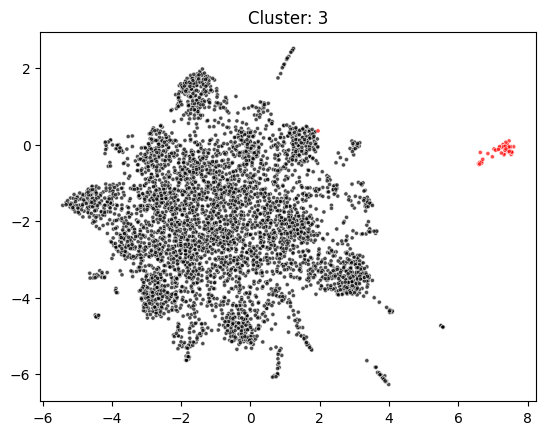

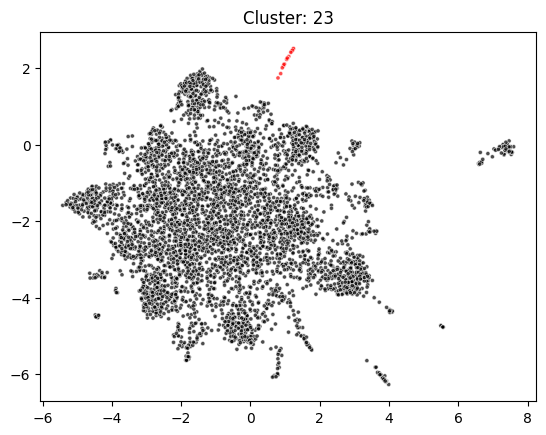

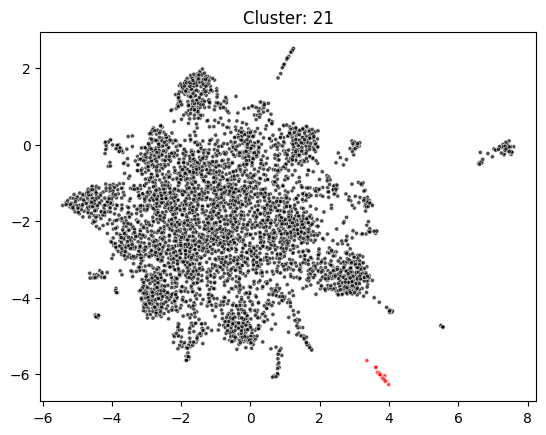

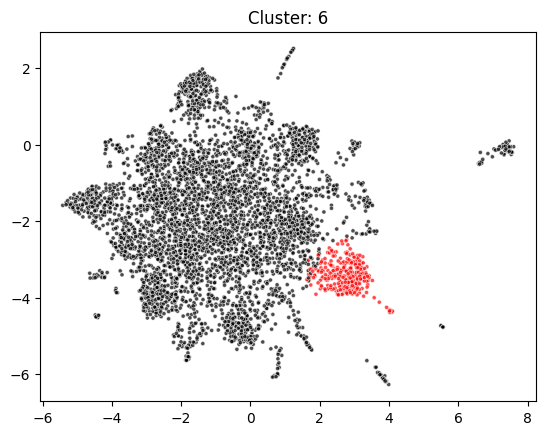

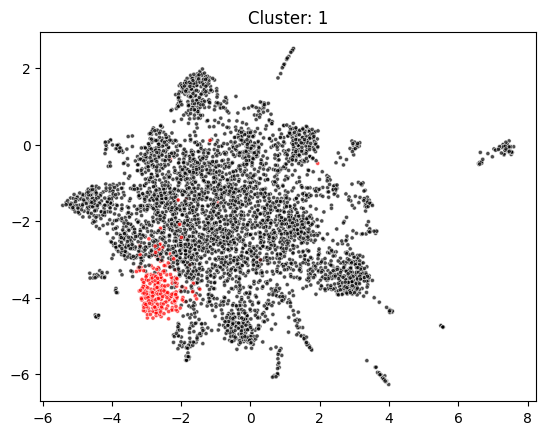

...

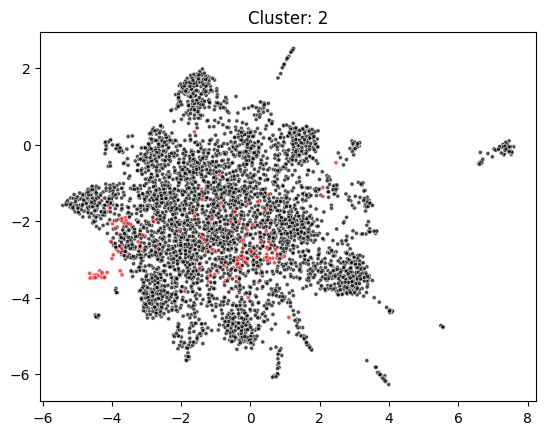

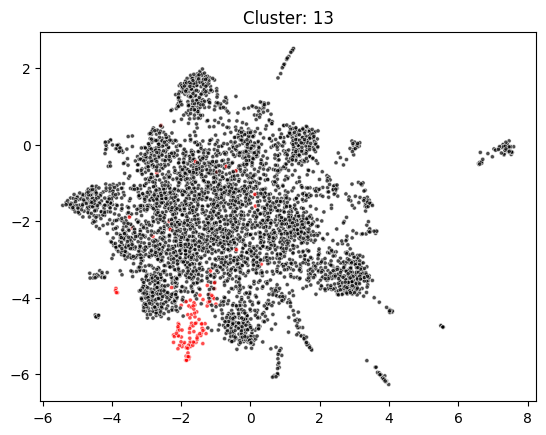

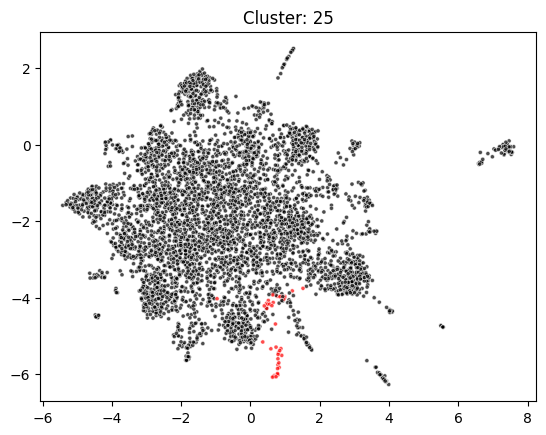

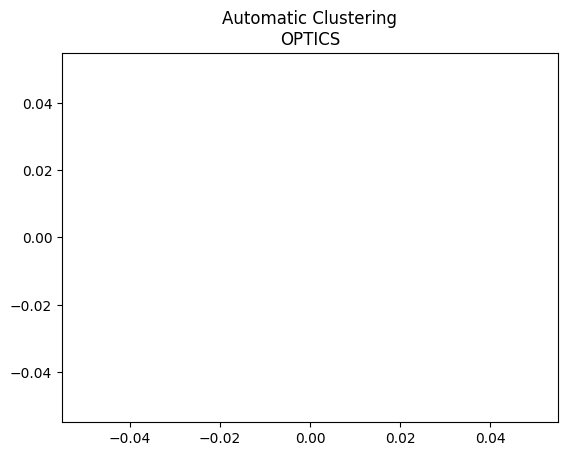

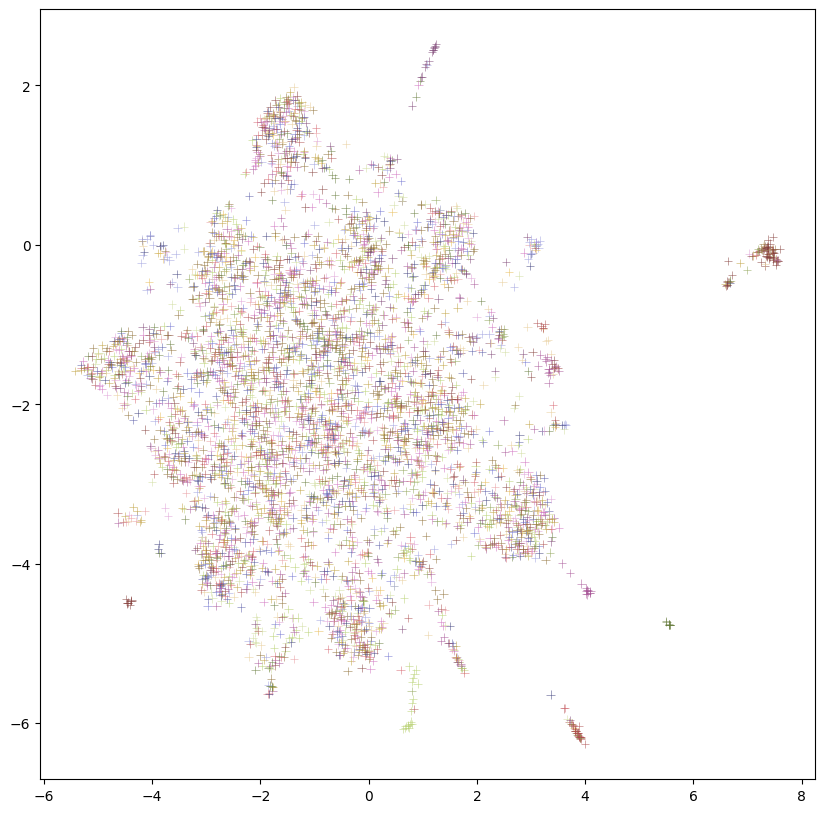

In [21]:
for klass in clusterdf.sort_values("s_score",ascending=False)["id"]:
    cluster_bit_vec = np.array(clust.labels_ == klass) 
    # Plot Cluster
    kum1 = um1[clust.labels_ == klass]
    kum2 = um2[clust.labels_ == klass]
    sns.scatterplot(x=um1,y=um2,c=['r' if b else 'k' for b in cluster_bit_vec],alpha=0.7,marker='.')
    plt.title(f"Cluster: {klass}")
    plt.show()


plt.scatter(um1[clust.labels_ == -1], um2[clust.labels_ == -1], c="k", marker="+", alpha=0.1)
plt.title("Automatic Clustering\nOPTICS")
plt.show()

# Plot w/ MOA
fig = plt.figure(figsize=(10,10))
sns.despine(fig=fig)
sns.scatterplot(x=um1,y=um2,c=labels_to_colors([str(broad_to_moa[cid]) for cid in gidf.index]),alpha=0.7,marker='+')
plt.show()

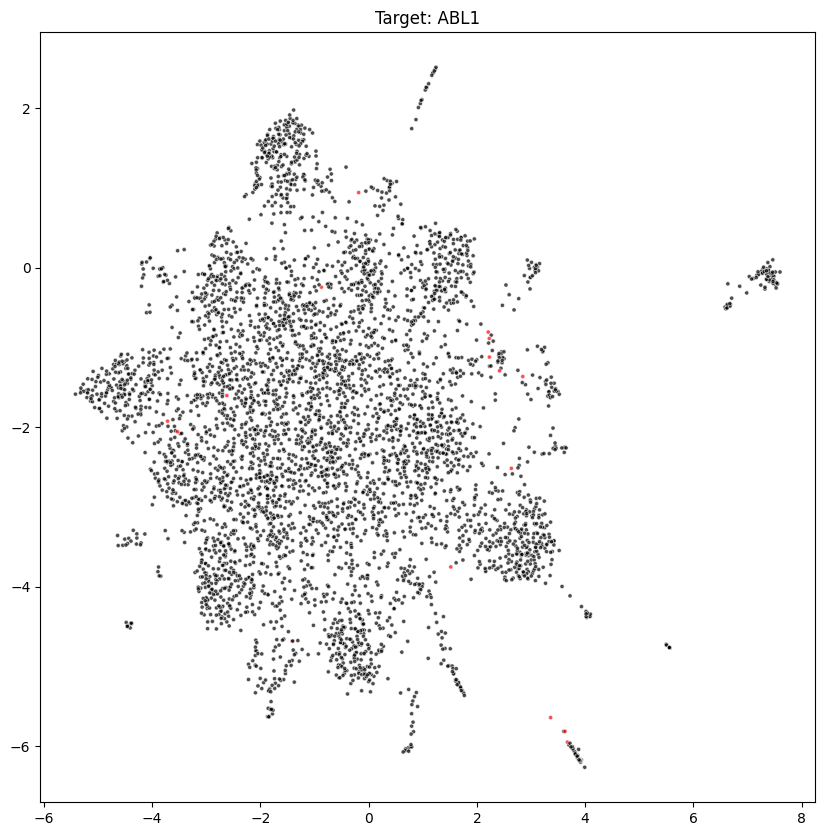

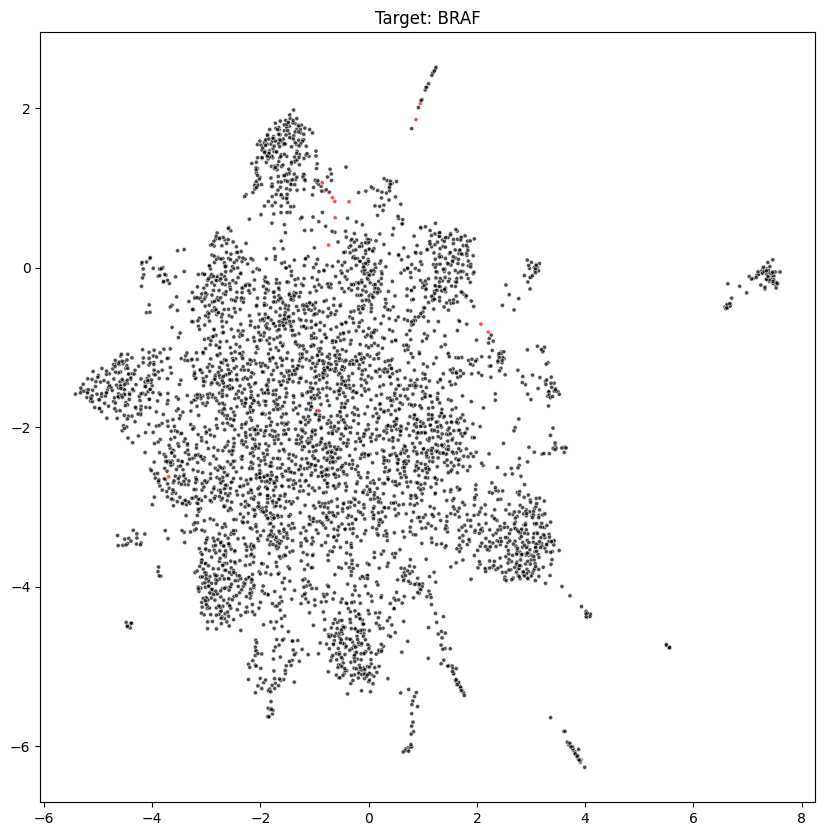

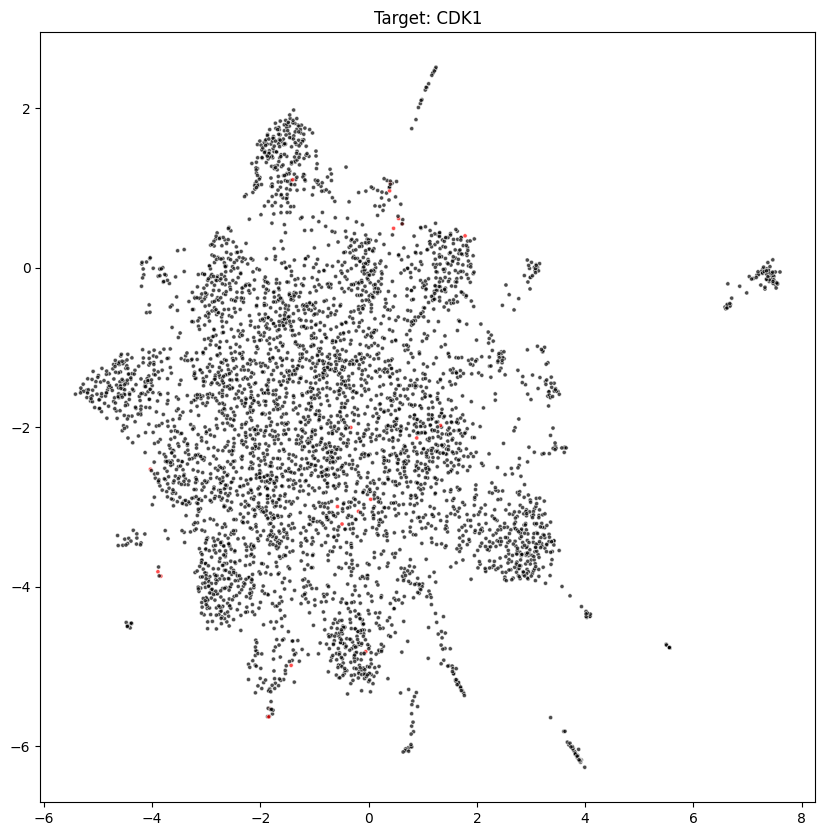

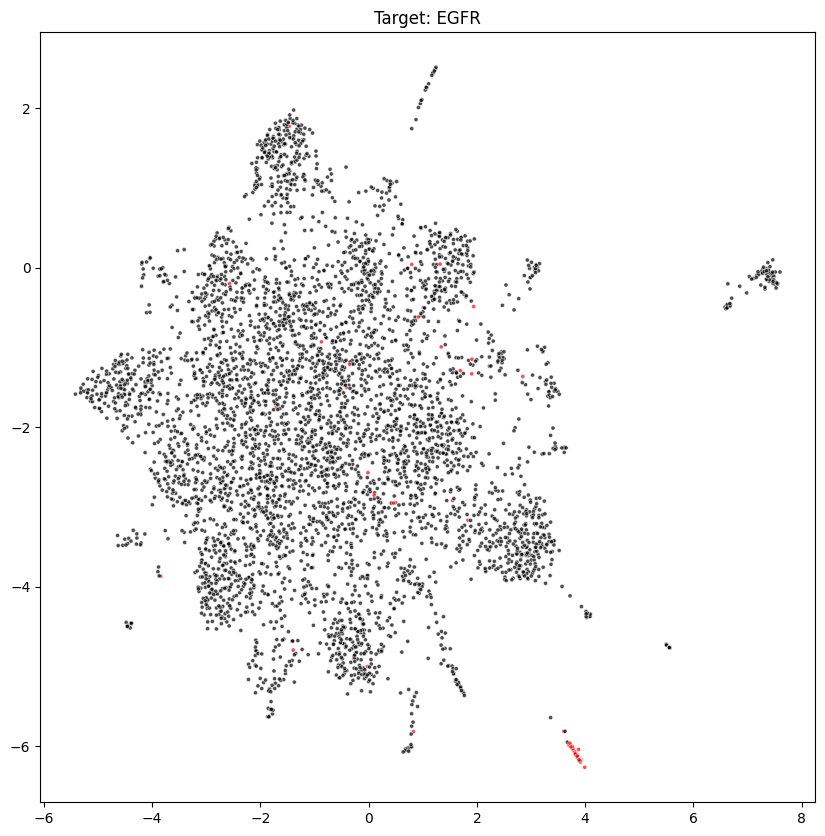

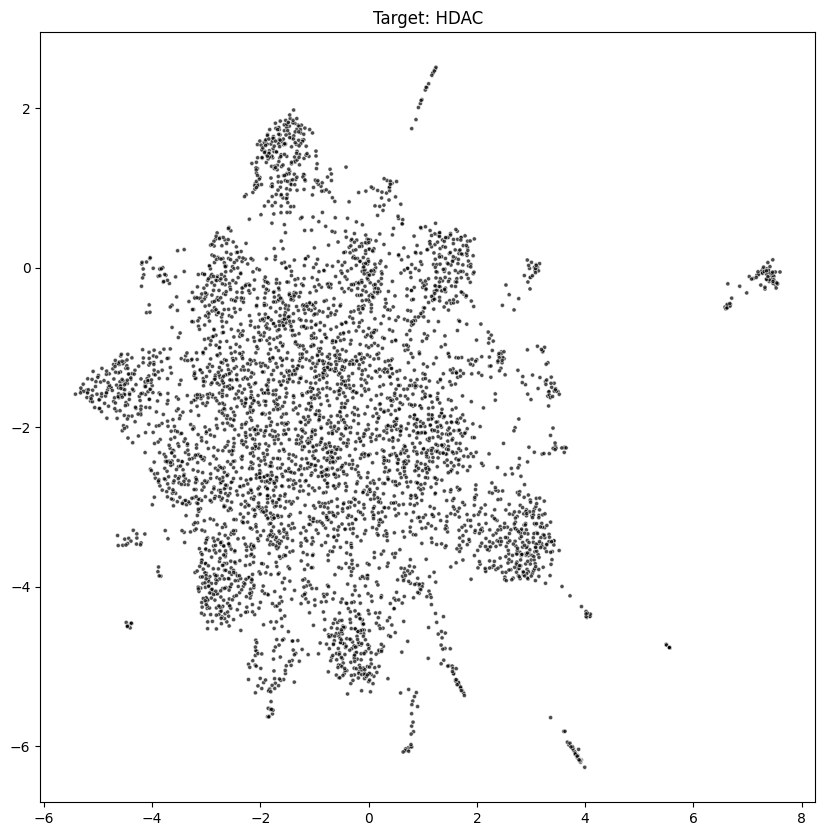

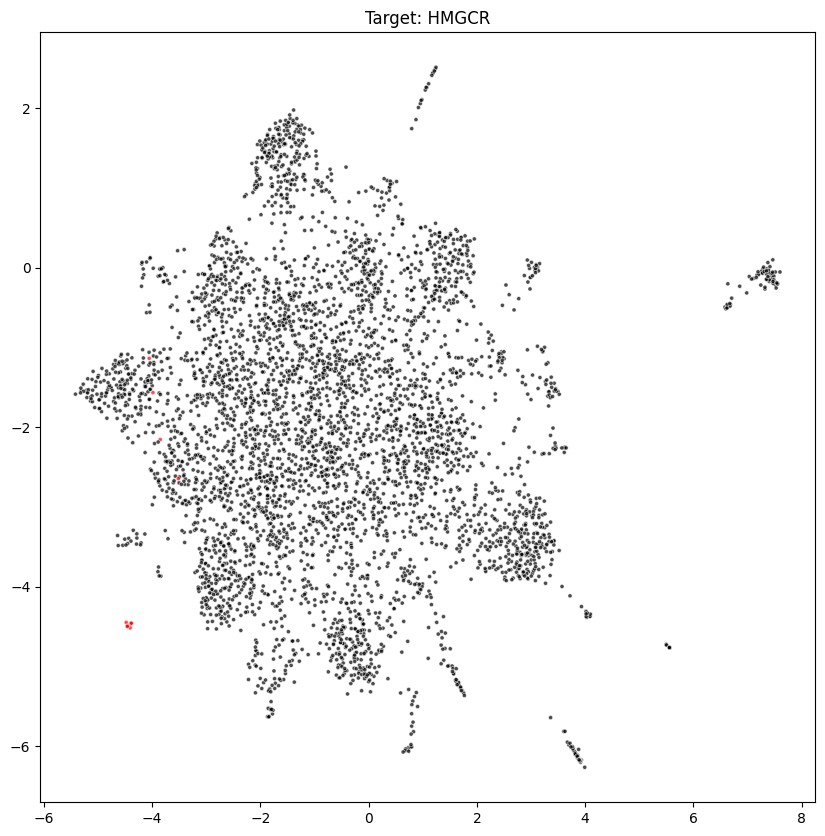

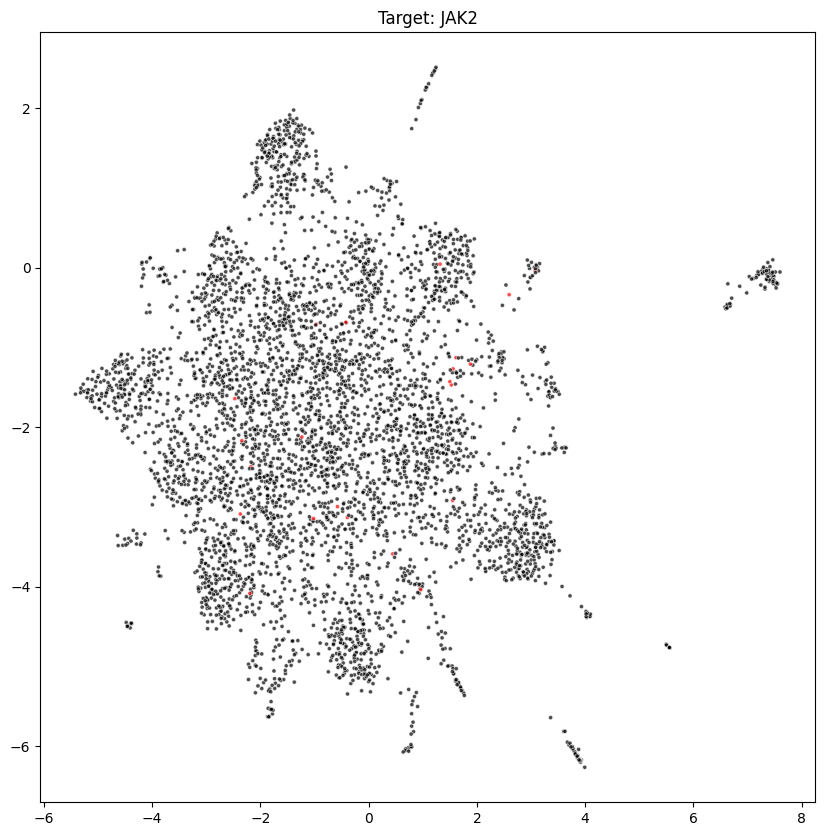

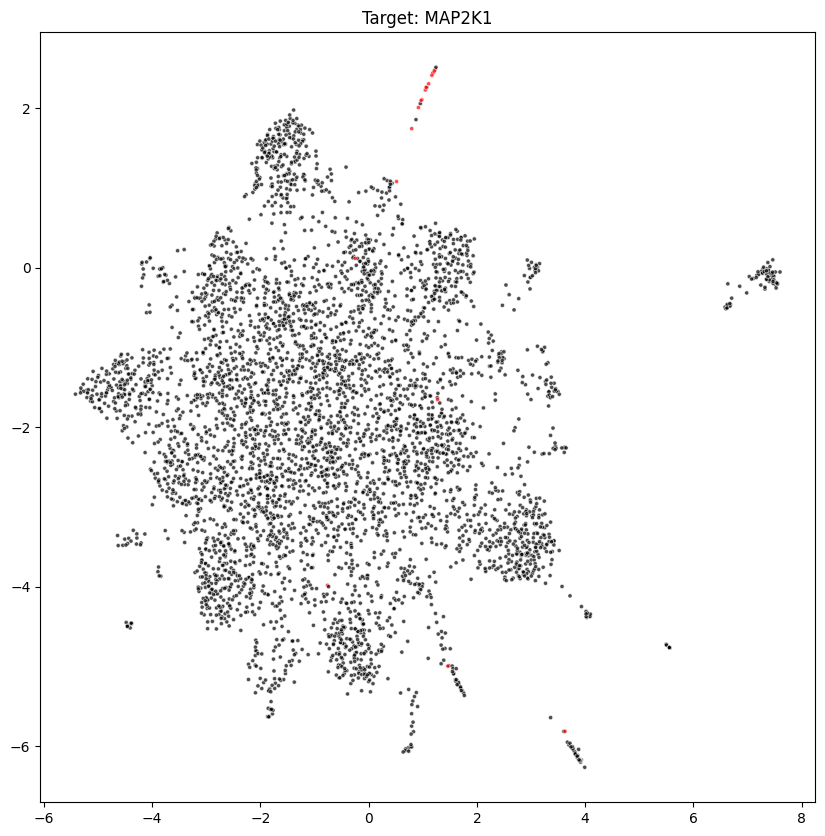

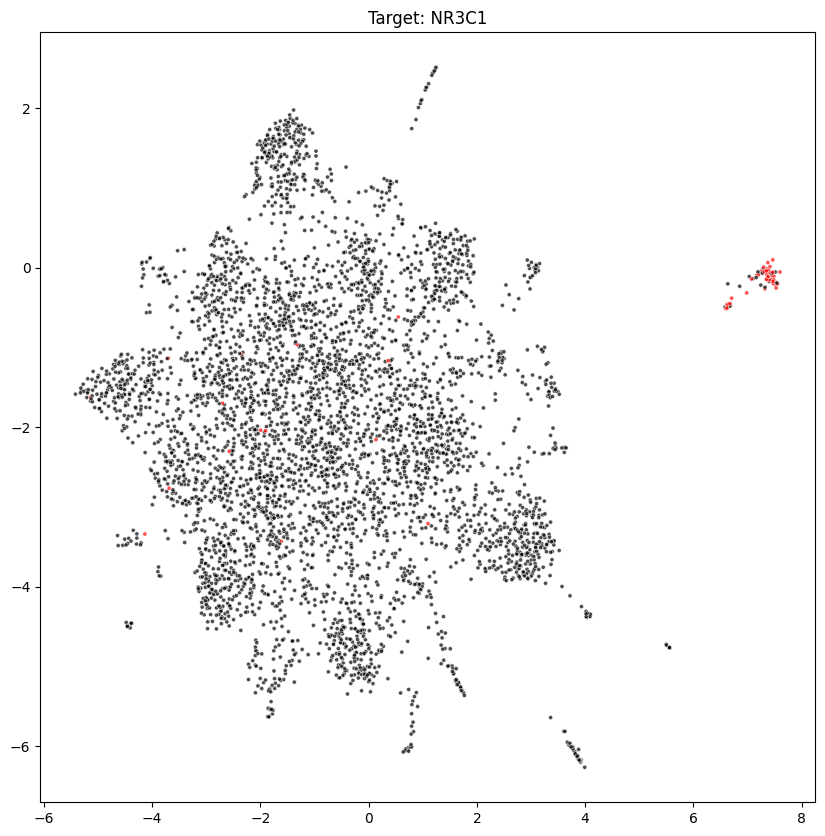

In [22]:
for target in targets_of_interest:
    bid_set = set(target_to_bids[target])
    target_bit_vec = [bid in bid_set for bid in gidf.index]
    plt.figure(figsize=(10,10))
    sns.scatterplot(x=um1,y=um2,c=['r' if b else 'k' for b in target_bit_vec],alpha=0.7,marker='.')
    plt.title(f'Target: {target}') 
    plt.show()

In [23]:
big_df.columns

Index(['column_name', 'broad_id', 'name', 'dose', 'screen_id', 'moa', 'target',
       'disease.area', 'indication', 'smiles', 'phase', 'treatment_id',
       'umap_1', 'umap_2', 'cluster_labels', 'sample_silhouette_score', 'id',
       'size', 's_score', 'top_target', 'top_target_percentage', 'target_desc',
       'cell_desc'],
      dtype='object')

In [24]:
agreement = []
of_interest = []
its = set(targets_of_interest)
for tgs,top_target in zip(big_df.target,big_df.top_target):
    targets = set([t.strip() for t in str(tgs).split(",")])
    interesting = False
    agree = False
    if top_target in targets:
        agree = True
    if top_target in its or len(its.intersection(targets)):
        interesting = True
    agreement.append(agree)
    of_interest.append(interesting)

big_df['is_interesting'] = of_interest
big_df['cluster_agreement'] = agreement    
big_df = big_df.sort_values(['is_interesting','cluster_agreement','top_target_percentage','sample_silhouette_score'],ascending=[False,True,False,False])
big_df.head(50)[['name','moa','target','top_target','top_target_percentage', 'target_desc','cell_desc','sample_silhouette_score']]     

,name,moa,target,top_target,top_target_percentage,target_desc,cell_desc,sample_silhouette_score
3560,ibrutinib,Bruton's tyrosine kinase (BTK) inhibitor,"BLK, BMX, BTK",EGFR,84.848485,"[EGFR: 84.85%, ERBB2: 57.58%, ERBB4: 21.21%]",[Cluster Drugs Inhibited Cell Growth in lung:A...,0.288249
2631,ARRY-334543,EGFR inhibitor,ERBB2,EGFR,84.848485,"[EGFR: 84.85%, ERBB2: 57.58%, ERBB4: 21.21%]",[Cluster Drugs Inhibited Cell Growth in lung:A...,0.169015
1642,saracatinib,src inhibitor,"ABL1, LCK, SRC, YES1",EGFR,84.848485,"[EGFR: 84.85%, ERBB2: 57.58%, ERBB4: 21.21%]",[Cluster Drugs Inhibited Cell Growth in lung:A...,0.156610
4660,bosutinib,"Abl kinase inhibitor, Bcr-Abl kinase inhibitor...","ABL1, BCR, CAMK1D, CAMK2G, CDK2, FRK, FYN, HCK...",EGFR,84.848485,"[EGFR: 84.85%, ERBB2: 57.58%, ERBB4: 21.21%]",[Cluster Drugs Inhibited Cell Growth in lung:A...,0.001251
2747,dasatinib,"Bcr-Abl kinase inhibitor, ephrin inhibitor, KI...","ABL1, ABL2, BLK, EPHA2, FGR, FRK, FYN, HCK, KI...",EGFR,84.848485,"[EGFR: 84.85%, ERBB2: 57.58%, ERBB4: 21.21%]",[Cluster Drugs Inhibited Cell Growth in lung:A...,-0.015260
257,hydrocortisone-valerate,glucocorticoid receptor agonist,NaN,NR3C1,70.833333,"[NR3C1: 70.83%, nan: 18.06%, SERPINA6: 16.67%]",[Cluster Drugs Promoted Cell Growth in pancrea...,0.361223
4552,SKF-86002,p38 MAPK inhibitor,"ALOX5, MAPK14",NR3C1,70.833333,"[NR3C1: 70.83%, nan: 18.06%, SERPINA6: 16.67%]",[Cluster Drugs Promoted Cell Growth in pancrea...,0.351096
523,prednisolone-tebutate,anti-inflammatory agent,NaN,NR3C1,70.833333,"[NR3C1: 70.83%, nan: 18.06%, SERPINA6: 16.67%]",[Cluster Drugs Promoted Cell Growth in pancrea...,0.349447
2685,dexamethasone-acetate,glucocorticoid receptor agonist,NaN,NR3C1,70.833333,"[NR3C1: 70.83%, nan: 18.06%, SERPINA6: 16.67%]",[Cluster Drugs Promoted Cell Growth in pancrea...,0.320318
3087,betamethasone-dipropionate,anti-inflammatory agent,NaN,NR3C1,70.833333,"[NR3C1: 70.83%, nan: 18.06%, SERPINA6: 16.67%]",[Cluster Drugs Promoted Cell Growth in pancrea...,0.290311


<Axes: xlabel='top_target_percentage', ylabel='sample_silhouette_score'>

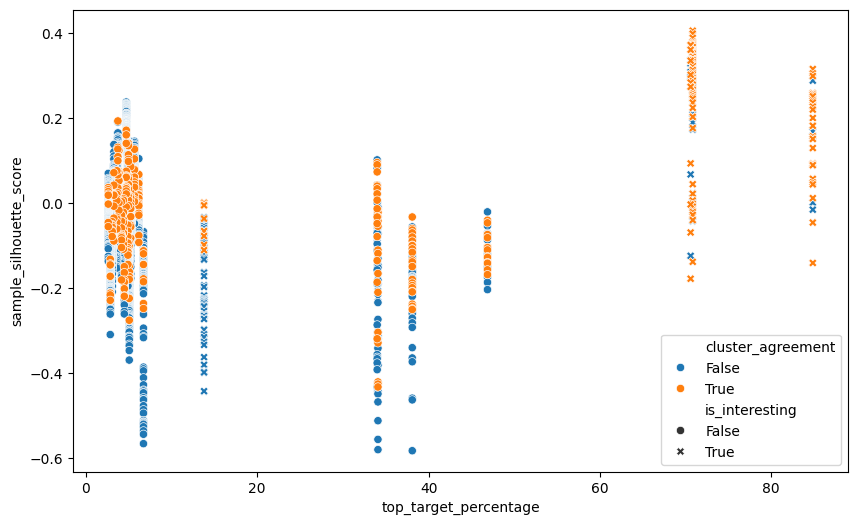

In [25]:
plt.figure(figsize=(10,6))
sns.scatterplot(big_df,y='sample_silhouette_score',x='top_target_percentage',style='is_interesting',hue='cluster_agreement')

<Axes: xlabel='umap_2', ylabel='umap_1'>

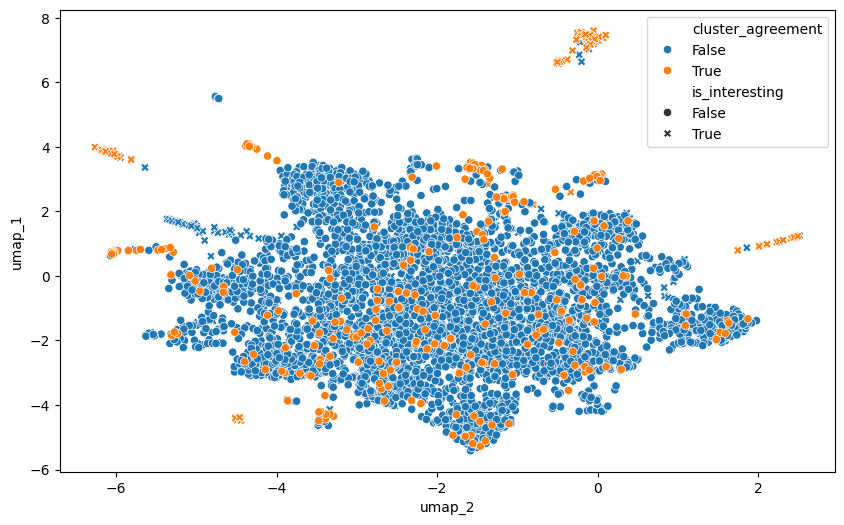

In [26]:
plt.figure(figsize=(10,6))
sns.scatterplot(big_df,y='umap_1',x='umap_2',style='is_interesting',hue='cluster_agreement')

In [27]:
import pandas as pd
import pygwalker as pyg

In [28]:
#walker = pyg.walk(big_df)